In [2]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import torch
import torch.optim as optim
import torchvision
import os
import matplotlib.gridspec as gridspec
import pandas as pd
import torch.nn as nn
import torch.nn.functional as F
import warnings
from sklearn import preprocessing
warnings.filterwarnings('ignore')
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
%config InlineBackend.figure_format = 'retina'
%matplotlib inline
try:
    from einops import rearrange
except ImportError:
    %pip install einops
    from einops import rearrange

torch.Size([3, 980, 1470])


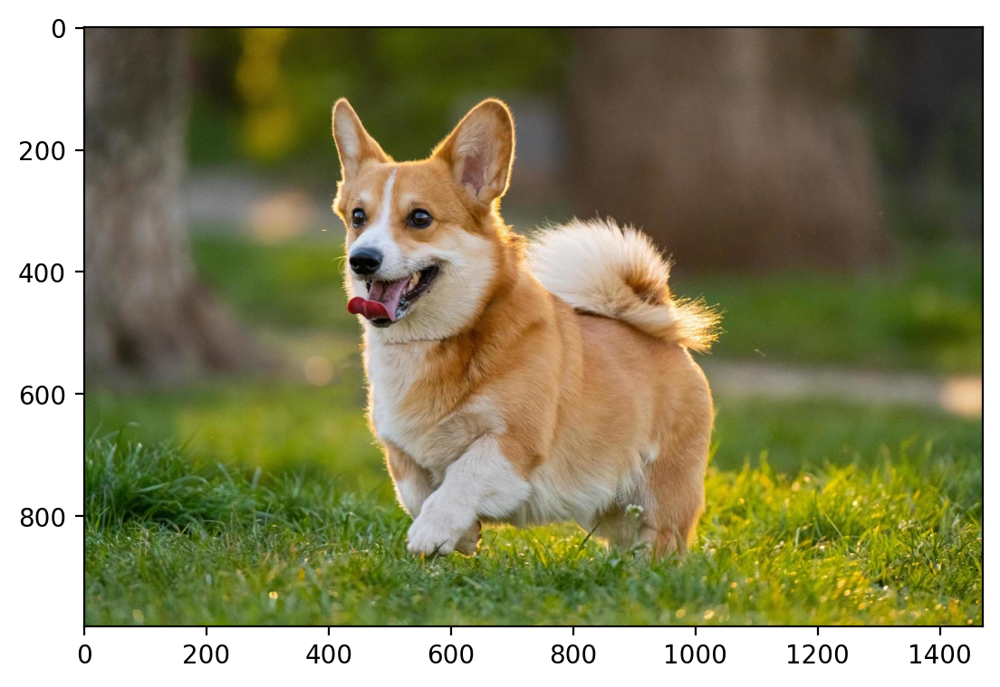

In [3]:
img = torchvision.io.read_image('dog.jpg')
img = img.clone()/255
print(img.shape)
img = img.permute(1,2,0)
plt.imshow(img)
# plt.imshow(img, cmap='gray')

tensor(432825)


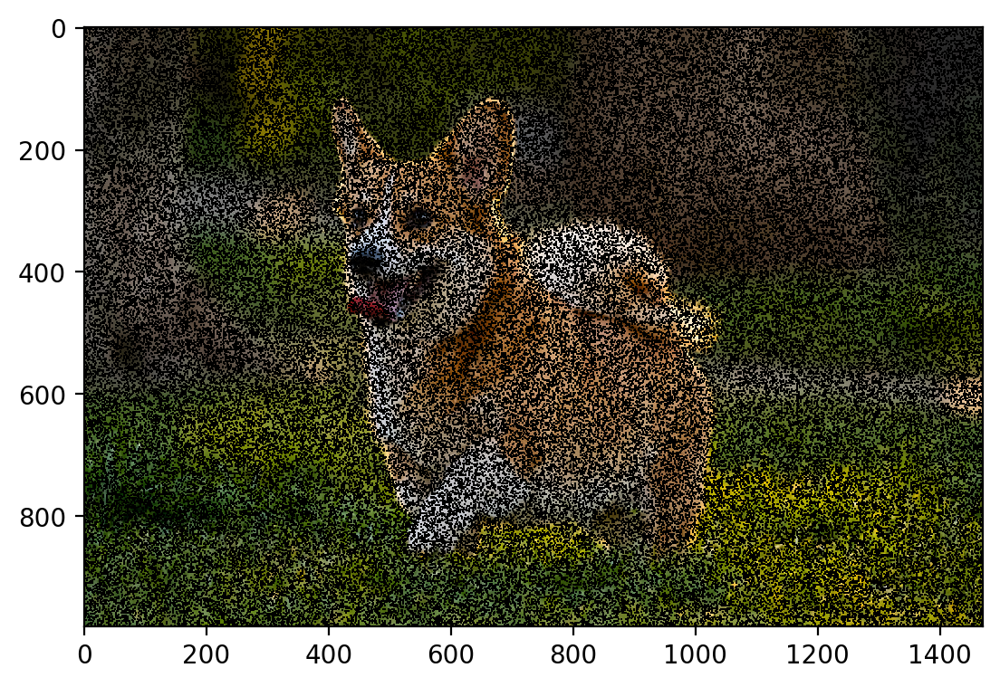

In [4]:
torch.manual_seed(42)
if torch.cuda.is_available():
    torch.cuda.manual_seed(42)
    torch.cuda.manual_seed_all(42)
def mask_2d_image(img, prop):
    img_copy = img.clone()
    mask = torch.rand(img.shape) < prop
    img_copy[mask] = float('nan')
    return img_copy, mask

def mask_image(img, prop):
    #img (torch.Tensor): A 3D image tensor of shape (height, width, channels).
    img_copy = img.clone()
    img_copy = img_copy.to(torch.float32)

    # Generate a 2D mask of shape (height, width)
    mask_2d = torch.rand(img.shape[0], img.shape[1]) < prop

    # Expand mask to match the image's 3D shape (height, width, channels)
    mask = mask_2d.unsqueeze(2).expand_as(img)

    # Set masked values to NaN
    img_copy[mask] = float('nan')
    # img_copy = img_copy.permute(1,2,0)
    
    return img_copy, mask

masked_image, mask = mask_image(img, 0.1)
print(mask.sum())
plt.imshow(masked_image)

In [5]:
def factorize(A, k, device=torch.device("cpu"), epsilon = 0.001):
    """Factorize the matrix D into A and B"""
    A = A.to(device)
    # Randomly initialize A and B
    W = torch.randn(A.shape[0], k, requires_grad=True, device=device)
    H = torch.randn(k, A.shape[1], requires_grad=True, device=device)
    # Optimizer
    optimizer = optim.Adam([W, H], lr=0.01)
    mask = ~torch.isnan(A)
    epoch = 0
    # Train the model
    while True:
        # Compute the loss
        diff_matrix = torch.mm(W, H) - A
        diff_vector = diff_matrix[mask]
        loss = torch.norm(diff_vector)

        # Zero the gradients
        optimizer.zero_grad()

        # Backpropagate
        loss.backward()

        # Update the parameters
        optimizer.step()
        epoch += 1
        if epoch>1:
            if prev_loss-loss < epsilon:
                break
        # if epoch>=100 and epoch%100==0:
        #     print(f'Epoch:{epoch}--->Loss:{loss}, prev_loss:{prev_loss}')
        prev_loss = loss

    # print(f'No of Epochs:{epoch}')

    return W, H, loss

def reconstruct_2d_img(masked_image,factors=50,device=torch.device("cpu")):#returns torch
    W, H, _ = factorize(masked_image,factors,device)
    reconstruct_img = torch.mm(W, H).cpu().detach()
    return reconstruct_img

def factorize_3d(A, k, device=torch.device("cpu"), epsilon = 0.001):
	A = A.to(device)
	if A.shape[2] == 3:
		# A1,A2,A3 = A[:,:,0],A[:,:,1],A[:,:,2]
		A_3d = A.permute(2,0,1)
	else:
		A_3d = A
	W_3d = []
	H_3d = []
	loss_3d = []

	for a in A_3d:
		W,H,loss = factorize(a,k,device,epsilon)
		W_3d.append(W)
		H_3d.append(H)
		loss_3d.append(loss)

	return W_3d,H_3d,loss_3d

def reconstruct_3d_img(masked_image,factors=50,device=torch.device("cpu")):
	W_3d,H_3d,_ = factorize_3d(masked_image,factors,device)
	A = []
	for i in range(3):
		a = torch.mm(W_3d[i], H_3d[i]).cpu().detach()
		A.append(a)
	A = torch.stack(A)
	A = A.permute(1,2,0)
	return A.cpu().detach()


In [6]:
def compute_rmse(tensor1, tensor2):
    # Ensure both tensors are on the same device (GPU)
    assert tensor1.shape == tensor2.shape, "Tensors must have the same shape"

    mse = torch.mean((tensor1 - tensor2) ** 2)
    rmse = torch.sqrt(mse)
    return rmse.item()

def compute_psnr(tensor1, tensor2, max_pixel_value=1.0):
    mse = torch.mean((tensor1 - tensor2) ** 2)
    psnr = 10 * torch.log10(max_pixel_value ** 2 / mse)
    return psnr.item()


def plot_image_completion(img, prop=0.3, factors=50):
    masked_image, mask = mask_image(img, prop)
    reconstructed_img = reconstruct_3d_img(masked_image, factors)
    print(f'For Reconstructed and Original Images with prop:{prop}, factors:{factors}')
    print(f'RMSE:{compute_rmse(reconstructed_img,img)} and PSNR:{compute_psnr(reconstructed_img,img)}')
    print(f'For Reconstructed and Masked Images with prop:{prop}, factors:{factors}')
    print(f'RMSE:{compute_rmse(reconstructed_img[~mask],masked_image[~mask])} and PSNR:{compute_psnr(reconstructed_img[~mask],masked_image[~mask])}')
    reconstructed_img = reconstructed_img.numpy()
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))
    ax[0].imshow(masked_image)
    ax[0].set_title("Masked image")
    ax[1].imshow(img)
    ax[1].set_title("Original image")
    ax[2].imshow(reconstructed_img)
    ax[2].set_title("Reconstructed image")
    fig.suptitle(f'prop:{prop}, factors:{factors}')
    plt.show()

For Reconstructed and Original Images with prop:0.1, factors:25
RMSE:0.06024632230401039 and PSNR:24.40138816833496
For Reconstructed and Masked Images with prop:0.1, factors:25
RMSE:0.059989750385284424 and PSNR:24.438459396362305


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


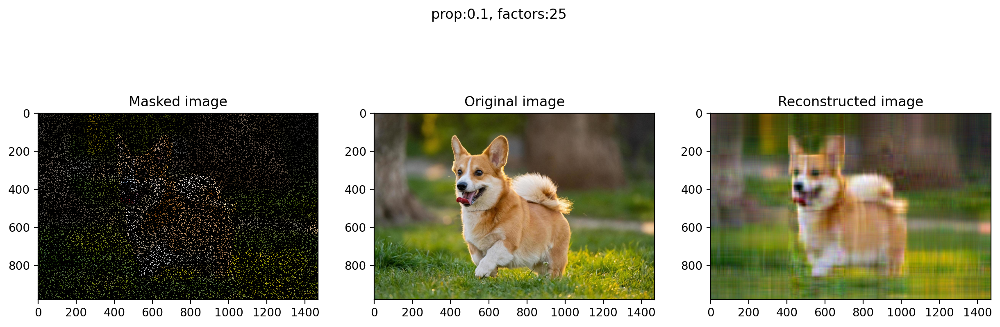

For Reconstructed and Original Images with prop:0.1, factors:50
RMSE:0.05691962689161301 and PSNR:24.894760131835938
For Reconstructed and Masked Images with prop:0.1, factors:50
RMSE:0.05655335262417793 and PSNR:24.95083236694336


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


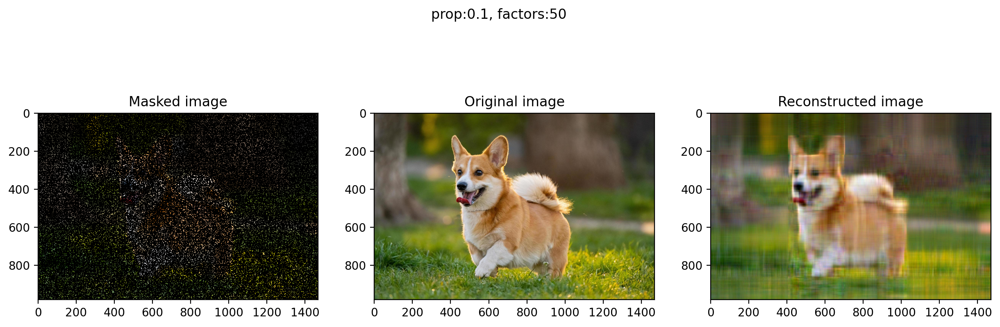

For Reconstructed and Original Images with prop:0.1, factors:100
RMSE:0.05361884459853172 and PSNR:25.413650512695312
For Reconstructed and Masked Images with prop:0.1, factors:100
RMSE:0.052961673587560654 and PSNR:25.52076530456543


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


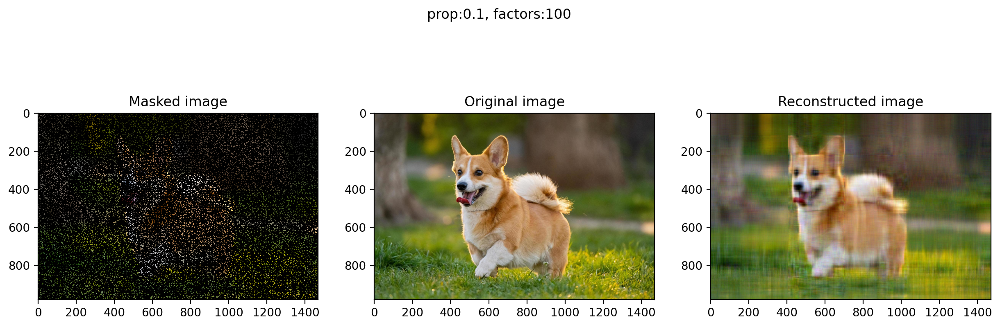

For Reconstructed and Original Images with prop:0.1, factors:150
RMSE:0.05268258601427078 and PSNR:25.56665802001953
For Reconstructed and Masked Images with prop:0.1, factors:150
RMSE:0.05173582211136818 and PSNR:25.724172592163086


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


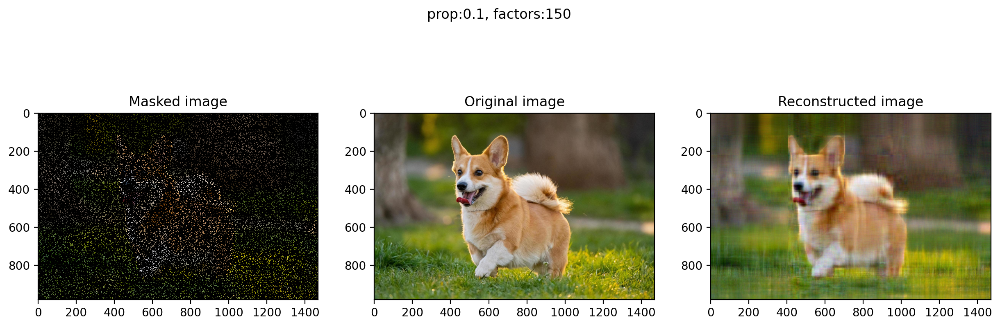

For Reconstructed and Original Images with prop:0.1, factors:200
RMSE:0.05197567120194435 and PSNR:25.683998107910156
For Reconstructed and Masked Images with prop:0.1, factors:200
RMSE:0.050706591457128525 and PSNR:25.898712158203125


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


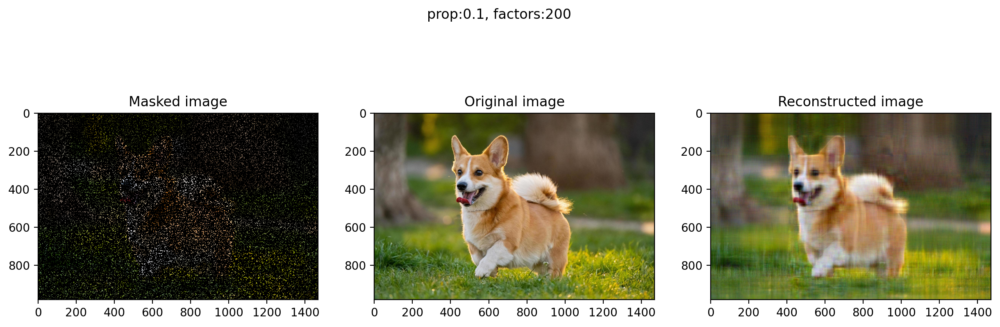

In [7]:
# plot_image_completion(img)
factors_i = [25,50,100,150,200]

for j in factors_i:
	plot_image_completion(img,prop=0.1,factors=j)

torch.Size([3, 980, 1470])


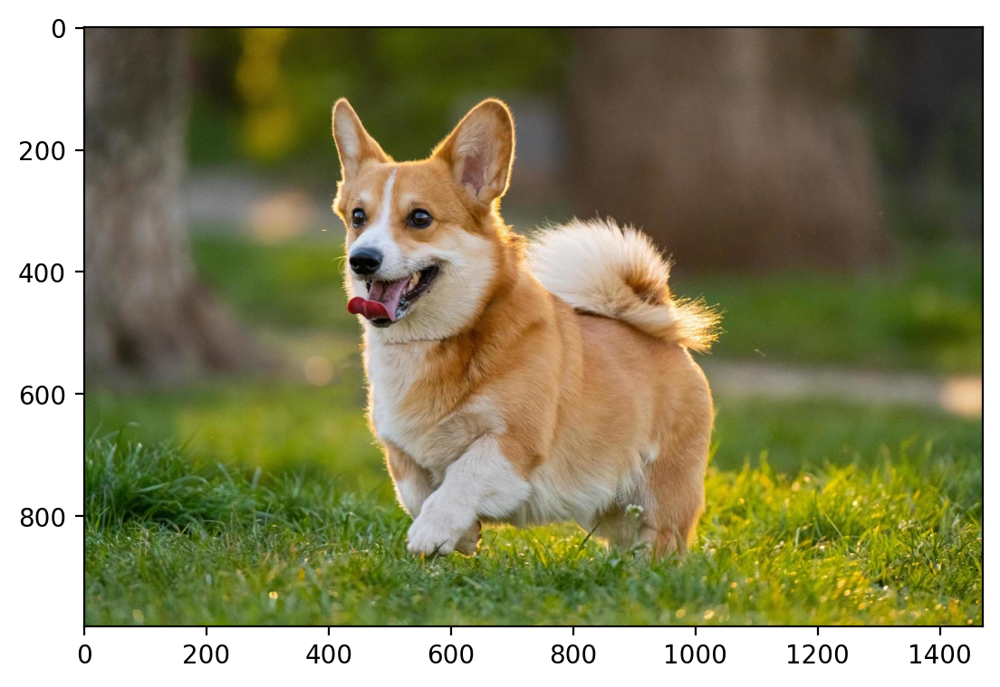

In [8]:
img = torchvision.io.read_image('dog.jpg')
img = img.clone()/255
print(img.shape)
img = img.permute(1,2,0)
plt.imshow(img)

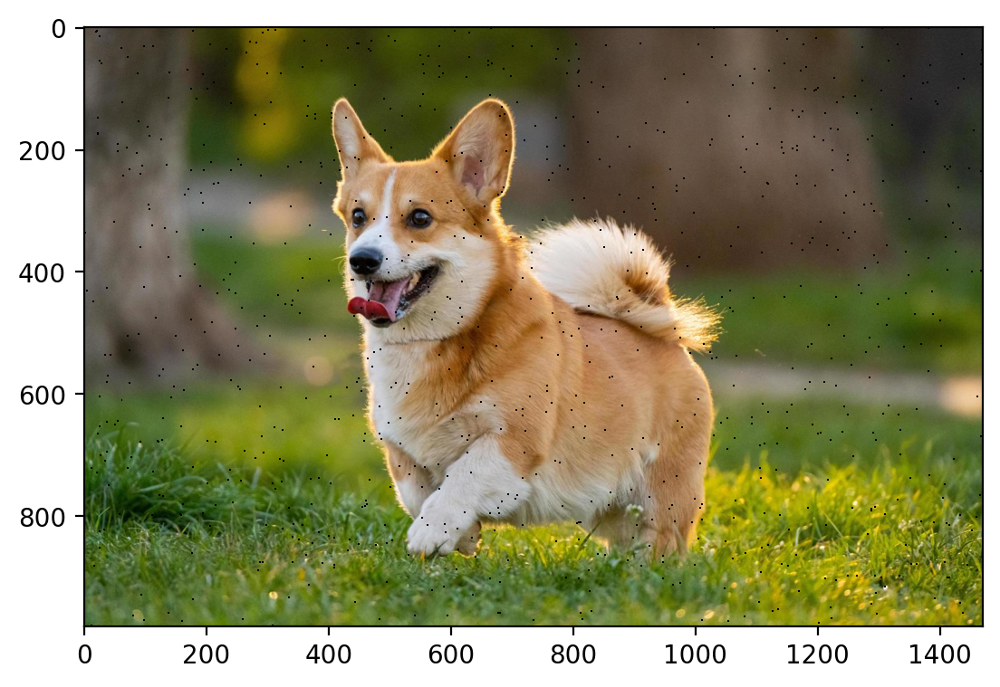

In [9]:
import numpy as np
import torch
import matplotlib.pyplot as plt

import torch

def mask_900_3d(img, num_masked_pixels = 900):
    # # Ensure the image tensor is in floating-point format
    img_copy = img.clone()
    img_copy = img_copy.to(torch.float32)
    img_shape = img_copy.shape

    # total_pixels = img_shape[0] * img_shape[1] * img_shape[2]
    
    # # Randomly select indices to mask
    # mask_indices = torch.randperm(total_pixels)[:num_masked_pixels]
    
    # # Create a boolean mask
    # mask = torch.zeros(total_pixels, dtype=torch.bool)
    # mask[mask_indices] = True
    
    # # Reshape mask to match the image shape
    # mask = mask.view(img_shape)
    
    # # Create a copy of the image to avoid modifying the original tensor
    # img_copy = img.clone()
    
    # # Apply the mask: replace masked values with NaN
    # img_copy[mask] = float('nan')
    total_pixels = img_shape[0] * img_shape[1]
    mask_indices = torch.randperm(total_pixels)[:num_masked_pixels]
    mask = torch.zeros(total_pixels, dtype=torch.bool)
    mask[mask_indices] = True
    mask = mask.view(img_shape[:2])
    mask = mask.unsqueeze(2).expand_as(img)
    img_copy[mask] = float('nan')
    
    return img_copy, mask

def mask_900_pixel(img):
    img = img.clone()  # Clone to avoid modifying the original image

    # Set random seeds and generate random starting points
    np.random.seed(50)
    a = np.random.randint(0, 269)
    np.random.seed(78)
    b = np.random.randint(0, 269)

    # Create a 30x30 mask filled with NaN
    mask = np.zeros((30, 30))
    mask[mask == 0] = float('nan')
    mask = torch.from_numpy(mask).float()

    # Apply the mask to the image in the specified region (2D image case)
    img[a:a+30, b:b+30] = mask

    # Save the masked rows and columns
    masked_rows = range(a, a+30)
    masked_cols = range(b, b+30)

    # Return the modified image and the masked rows and columns
    return img, masked_rows, masked_cols

# Assuming 'crop' is the input 2D grayscale image tensor
# mask_900_img, masked_rows, masked_cols = mask_900_pixel(crop)
mask_900_img, mask = mask_900_3d(img)

# Convert tensor to numpy for visualization
mask_900_img_np = mask_900_img.numpy()  # Directly convert since no channels
# Plot the masked image
plt.imshow(mask_900_img_np)
plt.show()

In [10]:
def plot_image_reconstructed(img,prop=0.3, factors=50):
    masked_image, mask = mask_900_3d(img)
    reconstructed_img = reconstruct_3d_img(masked_image, factors)
    print(f'For Reconstructed and Original Images with prop:{prop}, factors:{factors}')
    print(f'RMSE:{compute_rmse(reconstructed_img,img)} and PSNR:{compute_psnr(reconstructed_img,img)}')
    print(f'For Reconstructed and Masked Images with prop:{prop}, factors:{factors}')
    print(f'RMSE:{compute_rmse(reconstructed_img[~mask],masked_image[~mask])} and PSNR:{compute_psnr(reconstructed_img[~mask],masked_image[~mask])}')
    reconstructed_img = reconstructed_img.numpy()
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))
    ax[0].imshow(masked_image)
    ax[0].set_title("Masked image")
    ax[1].imshow(img)
    ax[1].set_title("Original image")
    ax[2].imshow(reconstructed_img)
    ax[2].set_title("Reconstructed image")
    fig.suptitle(f'prop:{prop}, factors:{factors}')
    plt.show()

For Reconstructed and Original Images with prop:0.3, factors:50
RMSE:0.05812093988060951 and PSNR:24.713346481323242
For Reconstructed and Masked Images with prop:0.3, factors:50
RMSE:0.058119576424360275 and PSNR:24.713552474975586


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


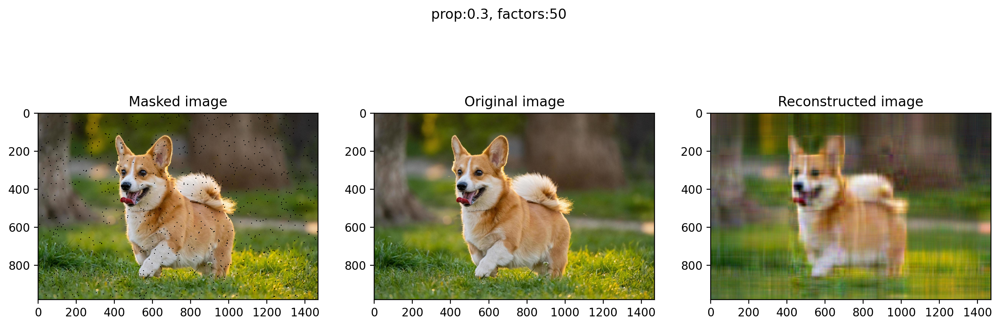

In [11]:
plot_image_reconstructed(img, factors=50)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0.5, 1.0, 'Reconstructed image')

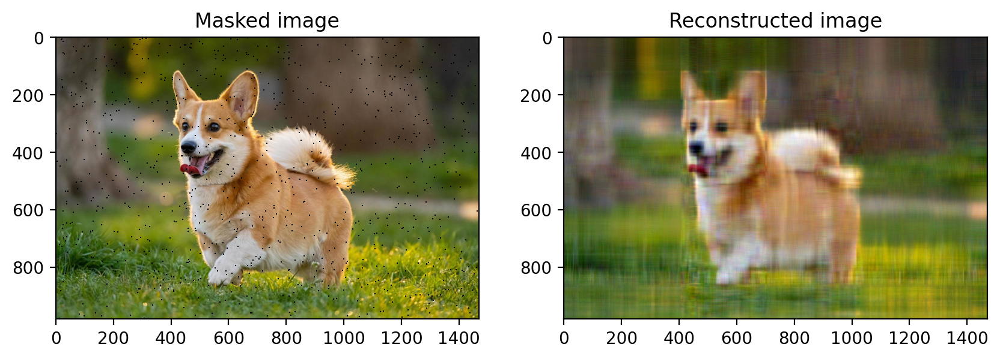

In [12]:
mf_reconstructed_900_img = reconstruct_3d_img(mask_900_img)
ig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(mask_900_img)
ax[0].set_title("Masked image")
ax[1].imshow(mf_reconstructed_900_img, cmap="gray")
ax[1].set_title("Reconstructed image")

In [13]:
print(mask_900_img.shape)

torch.Size([980, 1470, 3])


In [14]:
crop = torchvision.transforms.functional.crop(img.cpu(), 200, 400, 300, 300)
crop.shape

torch.Size([980, 300, 300])

In [17]:
def create_coordinate_map(img):
    """
    img: torch.Tensor of shape (num_channels, height, width)

    return: tuple of torch.Tensor of shape (height * width, 2) and torch.Tensor of shape (height * width, num_channels)
    """

    num_channels, height, width = img.shape
    w_coords = torch.arange(width).repeat(height, 1)
    h_coords = torch.arange(height).repeat(width, 1).t()
    w_coords = w_coords.reshape(-1)
    h_coords = h_coords.reshape(-1)

    X = torch.stack([h_coords, w_coords], dim=1).to(torch.float32)

    X = X.to(device)

    # Reshape the image to (h * w, num_channels)
    Y = rearrange(img, 'c h w -> (h w) c').to(torch.float32)
    return X, Y

# If the image is grayscale (2D), convert it to 3D (RGB-like format)
if crop.dim() == 2:
    crop = crop.unsqueeze(0).repeat(3, 1, 1)

# if mask_900_img.dim() == 2:
#     mask_900_img = mask_900_img.unsqueeze(0).repeat(3, 1, 1)

# Coordinate mapping for the full image (RGB-like)
road_X, road_Y = create_coordinate_map(crop)

# Convert masked rows and columns into a tensor representing the masked region
masked_img = crop[:, 5, :][:, :, 5]

# Generate the coordinate map for the masked region
road_X_400, road_Y_400 = create_coordinate_map(masked_img)

# Move to GPU device
road_Y = road_Y.to(device)
road_Y_400 = road_Y_400.to(device)

# Scaling the coordinates using MinMaxScaler
scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(road_X.cpu())  # road_X is scaled on the CPU
scaler_X_400 = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(road_X_400.cpu())

# Transforming the scaled coordinates
road_X_scaled = torch.tensor(scaler_X.transform(road_X.cpu())).to(device)
road_X_400_scaled = torch.tensor(scaler_X_400.transform(road_X_400.cpu())).to(device)

# Set to dtype float32
road_X_scaled = road_X_scaled.to(torch.float32)
road_X_400_scaled = road_X_400_scaled.to(torch.float32)

IndexError: too many indices for tensor of dimension 2

In [ ]:
image_for_display = rearrange(cropped_image, 'c h w -> h w c')

# Display the image
plt.imshow(image_for_display.cpu().numpy())  # Convert to NumPy for plotting
plt.axis('off')  # Optional: Turn off axis if not needed
plt.show()